In [1]:
import folium
import geopandas as gpd
import random
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
import joblib
from datetime import timedelta
import os
import streamlit as st
import plotly.graph_objects as go

In [2]:
# getting the current date hour in pakistan
def get_pakistan_time():
    # getting the current date and time in Pakistan
    now = datetime.now(timezone('Asia/Karachi'))
    # returning it in this format '2021-09-01 00:00:00'
    formatted_time = now.strftime('%Y-%m-%d %H:00:00')
    return formatted_time


def get_pollutant_values(date_hour):
    # loading the forecasted data
    forecasted_df = pd.read_csv('../New_data/forecasted_pollutant.csv')
    # replacing unnamed column with date
    forecasted_df = forecasted_df.rename(columns={'Unnamed: 0': 'date'})
    # setting the date column as index
    forecasted_df = forecasted_df.set_index('date')
    pollutant_values = forecasted_df.loc[date_hour, ['Aqi', 'Carbon_monoxide', 'District', 'Dust',
       'Nitrogen_dioxide', 'Ozone', 'Pm_10', 'Pm_25', 'Sulphur_dioxide']]
    pollutant_values_agg = pollutant_values.groupby('District').mean()
    return pollutant_values_agg

In [3]:
# testing

time = get_pakistan_time()

# aggregating the pollutant values
aggregate = get_pollutant_values(time).sort_values(by='Aqi', ascending=True)

FileNotFoundError: [Errno 2] No such file or directory: '../New_data/forecasted_pollutant.csv'

In [23]:
aggregate.index

Index(['Dera Ghazi Khan', 'Mianwali', 'Khushab', 'Chakwal', 'Rajanpur',
       'Bhakkar', 'Attock', 'Mandi Bahuddin', 'Nankana Sahib', 'Kasur',
       'Sargodha', 'Rawalpindi', 'Gujrat', 'Jhang', 'Gujranwala', 'Layyah',
       'Muzaffargarh', 'Sheikhupura', 'Bahawalpur', 'Lahore', 'Hafizabad',
       'Jhelum', 'Chiniot', 'Toba Tek Singh', 'Okara', 'Sialkot', 'Faisalabad',
       'Multan', 'Narowal', 'Lodhran', 'Khanewal', 'Rahim Yar Khan',
       'Bahawalnagar', 'Vehari', 'Sahiwal', 'Pakpattan'],
      dtype='object', name='District')

In [24]:
aggregate.head()

,Aqi,Carbon_monoxide,Dust,Nitrogen_dioxide,Ozone,Pm_10,Pm_25,Sulphur_dioxide
District,,,,,,,,
Dera Ghazi Khan,61.402801,332.547299,-62.198436,5.187201,166.071508,34.679144,15.617098,12.987001
Mianwali,73.339210,416.502847,0.709479,17.560962,166.297831,31.162376,17.209773,2.964852
Khushab,73.840110,347.493966,59.135287,16.173240,177.932036,40.001229,22.146067,3.779339
Chakwal,75.199365,426.260191,14.295801,19.918140,165.611300,28.342344,19.648744,3.119336
Rajanpur,76.382655,274.910571,259.398409,7.971412,154.504353,56.079249,18.099505,7.308398


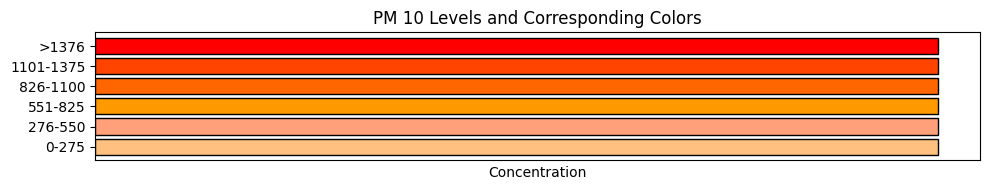

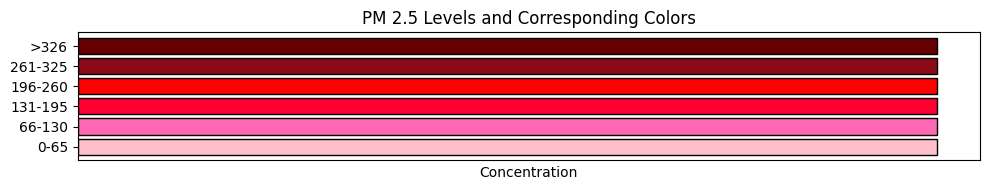

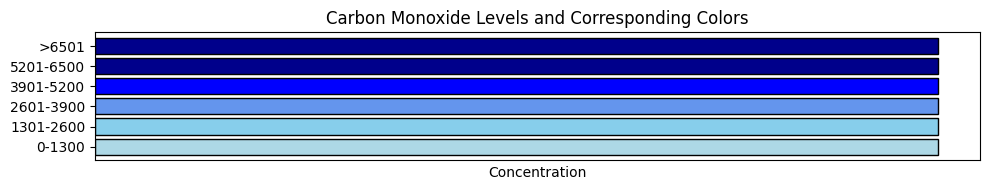

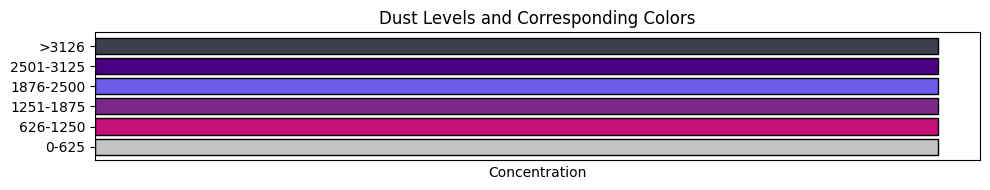

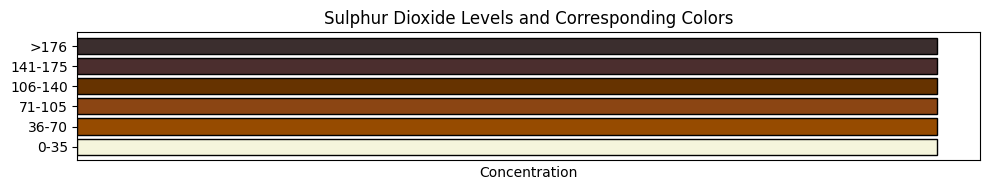

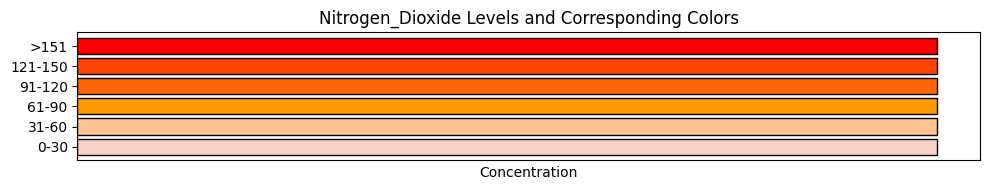

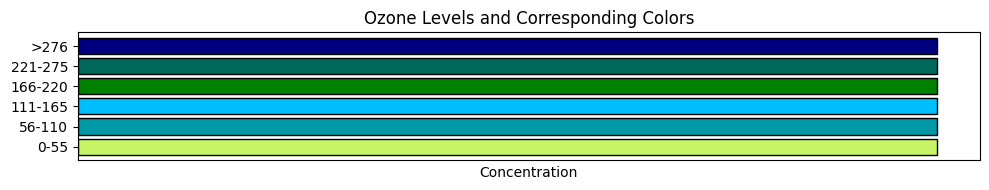

In [28]:
import matplotlib.pyplot as plt

# Define color ranges and values for each pollutant
color_mapping = {
    'PM 10': [(0, 275, '#FFC080'), (276, 550, '#FFA07A'), (551, 825, '#FF9900'), (826, 1100, '#FF6600'), (1101, 1375, '#FF4400'), (1376, float('inf'), '#FF0000')],
    'PM 2.5': [(0, 65, '#FFC0CB'), (66, 130, '#FF69B4'), (131, 195, '#FF0033'), (196, 260, '#FF0000'), (261, 325, '#8B0A1A'), (326, float('inf'), '#660000')],
    'Carbon Monoxide': [(0, 1300, '#ADD8E6'), (1301, 2600, '#87CEEB'), (2601, 3900, '#6495ED'), (3901, 5200, '#0000FF'), (5201, 6500, '#00008B'), (6501, float('inf'), '#00008B')],
    'Dust': [(0, 625, '#C5C3C5'), (626, 1250, '#C5107A'), (1251, 1875, '#7A288A'), (1876, 2500, '#6c5ce7'), (2501, 3125, '#4B0082'), (3126, float('inf'), '#3B3F4E')],
    'Sulphur Dioxide': [(0, 35, '#F5F5DC'), (36, 70, '#964B00'), (71, 105, '#8B4513'), (106, 140, '#663300'), (141, 175, '#4B2E2E'), (176, float('inf'), '#3B2E2E')],
    'Nitrogen_Dioxide': [(0, 30, '#F7D2C4'), (31, 60, '#FFC394'), (61, 90, '#FF9900'), (91, 120, '#FF6600'), (121, 150, '#FF4400'), (151, float('inf'), '#FF0000')],
    'Ozone': [(0, 55, '#C7F464'), (56, 110, '#0097A7'), (111, 165, '#00BFFF'), (166, 220, '#008000'), (221, 275, '#00695C'), (276, float('inf'), '#000080')]
}

# Function to create a horizontal bar plot for a specific pollutant
def plot_pollutant_legend(pollutant):
    if pollutant not in color_mapping:
        raise ValueError(f"Invalid pollutant name: {pollutant}")
    
    # Extract the color ranges and values
    color_ranges = color_mapping[pollutant]
    colors = [color for _, _, color in color_ranges]
    labels = [f'{lower}-{upper}' if upper != float('inf') else f'>{lower}' for lower, upper, _ in color_ranges]

    # Create the figure and plot
    fig, ax = plt.subplots(figsize=(10, 2))
    ax.barh(range(len(labels)), [1]*len(labels), color=colors, edgecolor='black')
    
    # Set the labels and title
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels)
    ax.set_title(f'{pollutant} Levels and Corresponding Colors')
    ax.set_xlabel('Concentration')
    ax.set_xticks([])  # Remove x-axis ticks

    plt.tight_layout()
    plt.show()

# Example usage
plot_pollutant_legend('PM 10')
plot_pollutant_legend('PM 2.5')
plot_pollutant_legend('Carbon Monoxide')
plot_pollutant_legend('Dust')
plot_pollutant_legend('Sulphur Dioxide')
plot_pollutant_legend('Nitrogen_Dioxide')
plot_pollutant_legend('Ozone')


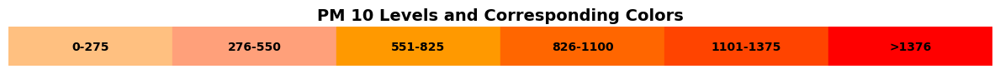

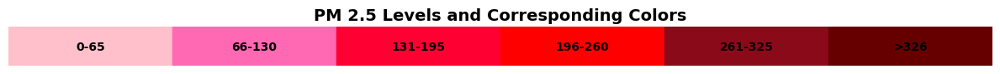

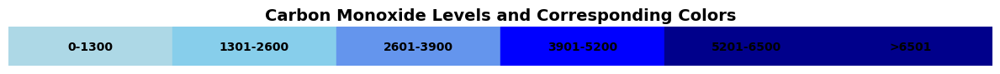

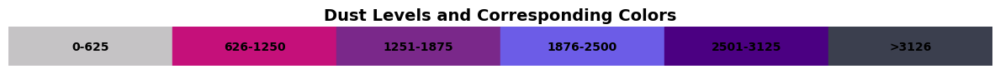

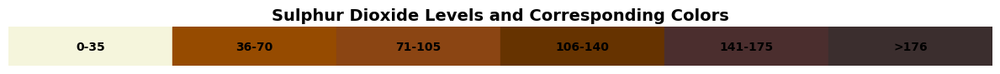

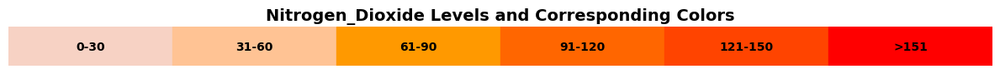

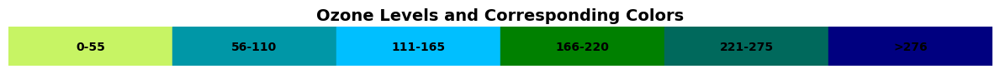

In [29]:
import matplotlib.pyplot as plt

# Define color ranges and values for each pollutant
color_mapping = {
    'PM 10': [(0, 275, '#FFC080'), (276, 550, '#FFA07A'), (551, 825, '#FF9900'), (826, 1100, '#FF6600'), (1101, 1375, '#FF4400'), (1376, float('inf'), '#FF0000')],
    'PM 2.5': [(0, 65, '#FFC0CB'), (66, 130, '#FF69B4'), (131, 195, '#FF0033'), (196, 260, '#FF0000'), (261, 325, '#8B0A1A'), (326, float('inf'), '#660000')],
    'Carbon Monoxide': [(0, 1300, '#ADD8E6'), (1301, 2600, '#87CEEB'), (2601, 3900, '#6495ED'), (3901, 5200, '#0000FF'), (5201, 6500, '#00008B'), (6501, float('inf'), '#00008B')],
    'Dust': [(0, 625, '#C5C3C5'), (626, 1250, '#C5107A'), (1251, 1875, '#7A288A'), (1876, 2500, '#6c5ce7'), (2501, 3125, '#4B0082'), (3126, float('inf'), '#3B3F4E')],
    'Sulphur Dioxide': [(0, 35, '#F5F5DC'), (36, 70, '#964B00'), (71, 105, '#8B4513'), (106, 140, '#663300'), (141, 175, '#4B2E2E'), (176, float('inf'), '#3B2E2E')],
    'Nitrogen_Dioxide': [(0, 30, '#F7D2C4'), (31, 60, '#FFC394'), (61, 90, '#FF9900'), (91, 120, '#FF6600'), (121, 150, '#FF4400'), (151, float('inf'), '#FF0000')],
    'Ozone': [(0, 55, '#C7F464'), (56, 110, '#0097A7'), (111, 165, '#00BFFF'), (166, 220, '#008000'), (221, 275, '#00695C'), (276, float('inf'), '#000080')]
}

# Function to create a rectangular plot for a specific pollutant
def plot_pollutant_legend(pollutant):
    if pollutant not in color_mapping:
        raise ValueError(f"Invalid pollutant name: {pollutant}")
    
    # Extract the color ranges and values
    color_ranges = color_mapping[pollutant]
    colors = [color for _, _, color in color_ranges]
    labels = [f'{lower}-{upper}' if upper != float('inf') else f'>{lower}' for lower, upper, _ in color_ranges]

    # Create the figure and plot
    fig, ax = plt.subplots(figsize=(12, 1))
    
    # Plot each color range as a rectangle
    for i, (range_label, color) in enumerate(zip(labels, colors)):
        ax.add_patch(plt.Rectangle((i, 0), 1, 1, color=color))
        ax.text(i + 0.5, 0.5, range_label, color='black', ha='center', va='center', fontsize=10, weight='bold')

    # Remove axes
    ax.set_xlim(0, len(labels))
    ax.set_ylim(0, 1)
    ax.axis('off')  # Turn off the axis

    # Set the title
    ax.set_title(f'{pollutant} Levels and Corresponding Colors', fontsize=14, weight='bold')

    plt.tight_layout()
    plt.show()

# Example usage
plot_pollutant_legend('PM 10')
plot_pollutant_legend('PM 2.5')
plot_pollutant_legend('Carbon Monoxide')
plot_pollutant_legend('Dust')
plot_pollutant_legend('Sulphur Dioxide')
plot_pollutant_legend('Nitrogen_Dioxide')
plot_pollutant_legend('Ozone')


### Working on the map

In [30]:

def get_AQI(date_hour, forecasted_df):
    return forecasted_df.loc[date_hour, ['Aqi', 'Location_id', 'District']]

def replace_space_with_underscore(aqi_color_dict):
    for key in list(aqi_color_dict.keys()):
        if ' ' in key:
            new_key = key.replace(' ', '_')
            aqi_color_dict[new_key] = aqi_color_dict.pop(key)
    return aqi_color_dict

# classifyint the AQI value with colours based on range

def get_AQI_color(aqi):
    if aqi <= 50:
        return 'Green'
    elif aqi <= 100:
        return 'Yellow'
    elif aqi <= 150:
        return 'Orange'
    elif aqi <= 200:
        return 'Red'
    elif aqi <= 300:
        return 'Purple'
    else:
        return 'Maroon'


def get_shapefiles():
    shapefiles = []
    for root, dirs, files in os.walk('district_by_name'):
        for file in files:
            if file.endswith('.shp'):
                shapefiles.append(file.split('.')[0])
    return shapefiles

def create_colored_map(locations_colors):
    # Calculate the centroid for the initial map position (average coordinates of Punjab region)
    center_x = 31.1471
    center_y = 75.3412

    # Create the Folium map
    m = folium.Map(location=[center_x, center_y], zoom_start=7)

    # adding a general map boundary
    gdf_1 = gpd.read_file('../punjabaoi/aoi_punjab.shp')
    # Add a GeoJSON layer
    folium.GeoJson(data=gdf_1.to_json(), name='My Shapefile').add_to(m)

    # Define a style function to set the color for each location
    def style_function(color):
        return {
            'fillColor': color,
            'weight': 2,  # Increase border thickness
            'color': color,
            'fillOpacity': 0.7,  # Increase fill opacity
            'opacity': 1,
        }

    # Loop through the locations and their colors
    for location, color in locations_colors.items():
        # Load the shapefile
        shp_path = f'../New_data/district_by_name/{location}.shp'
        gdf = gpd.read_file(shp_path)
        
        # Add GeoJSON layer to the map
        # Add GeoJSON layer to the map
        folium.GeoJson(
            data=gdf.to_json(),
            name=location,
            style_function=lambda feature, color=color: style_function(color),
            tooltip=folium.GeoJsonTooltip(fields=['district'], aliases=['District:']),
            overlay=True
        ).add_to(m)

    # Return the map object
    return m


In [31]:


def prepare_map_data():
    #########################################################
    # loading the forecasted data
    forecasted_df = pd.read_csv('../New_data/forecasted_pollutant.csv')
    # replacing unnamed column with date
    forecasted_df = forecasted_df.rename(columns={'Unnamed: 0': 'date'})
    # setting the date column as index
    forecasted_df = forecasted_df.set_index('date')
    # print(forecasted_df.head())
    ###########################################################
    date_hour = get_pakistan_time()
    aqi_hour = get_AQI(date_hour, forecasted_df)
    # aggregating the AQI values for each district
    aqi_district = aqi_hour.groupby('District').mean()
    # implementing on the aqi_hour and pollutant_values
    aqi_district['AQI_color'] = aqi_district['Aqi'].apply(lambda x: get_AQI_color(x))
    # getting the shapefiles
    shapefiles = get_shapefiles()
    # creating the aqi_color_dict
    aqi_color_dict = aqi_district['AQI_color'].to_dict()
    # fixing possible space issue   
    aqi_color_dict = replace_space_with_underscore(aqi_color_dict)
    # filtering aqi_color_dict based on the shapefiles
    aqi_color_dict_ = {k: v for k, v in aqi_color_dict.items() if k in shapefiles}
    ##############################################################
    # getting the current time in pakistan
    # current_time = get_pakistan_time()
    # Create the map with the sample data
    map_object = create_colored_map(aqi_color_dict_)
    return map_object

In [32]:
map = prepare_map_data()

In [33]:
# map

In [41]:
import pandas as pd
import geopandas as gpd
import folium
import numpy as np
from PIL import Image
import io
import os

# Define the color ranges and values for each pollutant
color_mapping = {
    'Pm_10': [(0, 275, '#FFC080'), (276, 550, '#FFA07A'), (551, 825, '#FF9900'), (826, 1100, '#FF6600'), (1101, 1375, '#FF4400'), (1376, float('inf'), '#FF0000')],
    'Pm_25': [(0, 65, '#FFC0CB'), (66, 130, '#FF69B4'), (131, 195, '#FF0033'), (196, 260, '#FF0000'), (261, 325, '#8B0A1A'), (326, float('inf'), '#660000')],
    'Carbon_monoxide': [(0, 1300, '#ADD8E6'), (1301, 2600, '#87CEEB'), (2601, 3900, '#6495ED'), (3901, 5200, '#0000FF'), (5201, 6500, '#00008B'), (6501, float('inf'), '#00008B')],
    'Dust': [(0, 625, '#C5C3C5'), (626, 1250, '#C5107A'), (1251, 1875, '#7A288A'), (1876, 2500, '#6c5ce7'), (2501, 3125, '#4B0082'), (3126, float('inf'), '#3B3F4E')],
    'Sulphur_dioxide': [(0, 35, '#F5F5DC'), (36, 70, '#964B00'), (71, 105, '#8B4513'), (106, 140, '#663300'), (141, 175, '#4B2E2E'), (176, float('inf'), '#3B2E2E')],
    'Nitrogen_dioxide': [(0, 30, '#F7D2C4'), (31, 60, '#FFC394'), (61, 90, '#FF9900'), (91, 120, '#FF6600'), (121, 150, '#FF4400'), (151, float('inf'), '#FF0000')],
    'Ozone': [(0, 55, '#C7F464'), (56, 110, '#0097A7'), (111, 165, '#00BFFF'), (166, 220, '#008000'), (221, 275, '#00695C'), (276, float('inf'), '#000080')]
}

def get_pollutant(date_hour, forecasted_df, pollutant):
    return forecasted_df.loc[date_hour, [pollutant, 'Location_id', 'District']]

def replace_space_with_underscore(aqi_color_dict):
    for key in list(aqi_color_dict.keys()):
        if ' ' in key:
            new_key = key.replace(' ', '_')
            aqi_color_dict[new_key] = aqi_color_dict.pop(key)
    return aqi_color_dict

def get_shapefiles():
    shapefiles = []
    for root, dirs, files in os.walk('district_by_name'):
        for file in files:
            if file.endswith('.shp'):
                shapefiles.append(file.split('.')[0])
    return shapefiles


def get_pollutant_color(pollutant, value):
    ranges = color_mapping[pollutant]
    for lower, upper, color in ranges:
        if lower <= value <= upper:
            return color
    # return the first color if no range matches as a default
    return ranges[0][2]


def create_colored_map(locations_colors):
    center_x = 31.1471
    center_y = 75.3412
    m = folium.Map(location=[center_x, center_y], zoom_start=7)
    gdf_1 = gpd.read_file('../punjabaoi/aoi_punjab.shp')
    folium.GeoJson(data=gdf_1.to_json(), name='My Shapefile').add_to(m)

    def style_function(color):
        return {
            'fillColor': color,
            'weight': 2,
            'color': color,
            'fillOpacity': 0.7,
            'opacity': 1,
        }

    for location, color in locations_colors.items():
        shp_path = f'../New_data/district_by_name/{location}.shp'
        gdf = gpd.read_file(shp_path)
        folium.GeoJson(
            data=gdf.to_json(),
            name=location,
            style_function=lambda feature, color=color: style_function(color),
            tooltip=folium.GeoJsonTooltip(fields=['district'], aliases=['District:']),
            overlay=True
        ).add_to(m)

    return m

def prepare_map_data(pollutant):
    forecasted_df = pd.read_csv('../New_data/forecasted_pollutant.csv')
    forecasted_df = forecasted_df.rename(columns={'Unnamed: 0': 'date'})
    forecasted_df = forecasted_df.set_index('date')
    date_hour = get_pakistan_time()
    aqi_hour = get_pollutant(date_hour, forecasted_df, pollutant)
    aqi_district = aqi_hour.groupby('District').mean()
    aqi_district['Color'] = aqi_district[pollutant].apply(lambda x: get_pollutant_color(pollutant, x))
    shapefiles = get_shapefiles()
    color_dict = aqi_district['Color'].to_dict()
    color_dict = replace_space_with_underscore(color_dict)
    color_dict_ = {k: v for k, v in color_dict.items() if k in shapefiles}
    map_object = create_colored_map(color_dict_)
    return map_object

# Example usage
map = prepare_map_data('Pm_25')


In [42]:
map

In [43]:
pollutant = 'Pm_25'
forecasted_df = pd.read_csv('../New_data/forecasted_pollutant.csv')
forecasted_df = forecasted_df.rename(columns={'Unnamed: 0': 'date'})
forecasted_df = forecasted_df.set_index('date')
date_hour = get_pakistan_time()
aqi_hour = get_pollutant(date_hour, forecasted_df, pollutant)
aqi_district = aqi_hour.groupby('District').mean()
aqi_district['Color'] = aqi_district[pollutant].apply(lambda x: get_pollutant_color(pollutant, float(x)))

In [44]:
get_pollutant_color(pollutant, 74.571429)

'#FF69B4'

In [45]:
aqi_district 


,Pm_25,Location_id,Color
District,,,
Attock,17.511092,143.250000,#FFC0CB
Bahawalnagar,38.064566,100.888889,#FFC0CB
Bahawalpur,36.591990,150.605263,#FFC0CB
Bhakkar,23.648433,108.454545,#FFC0CB
Chakwal,19.648744,182.300000,#FFC0CB
Chiniot,11.747814,184.500000,#FFC0CB
Dera Ghazi Khan,15.617098,171.333333,#FFC0CB
Faisalabad,17.386865,74.571429,#FFC0CB
Gujranwala,22.735267,76.500000,#FFC0CB


In [23]:
def last_year_aggregate_pollutants(initial_time, district):
    forecasted_df = pd.read_csv('last_year_pollutant.csv')
    # replacing unnamed column with date
    forecasted_df = forecasted_df.rename(columns={'Unnamed: 0': 'date'})
    # setting the date column as index
    forecasted_df = forecasted_df.set_index('Date')
    # converting the index to datetime
    forecasted_df.index = pd.to_datetime(forecasted_df.index)
    # Parse the initial time
    initial_time = pd.to_datetime(initial_time)
    # converting initial time to last year
    initial_time = initial_time - pd.Timedelta(days=366)
    final_time = initial_time + pd.Timedelta(days=60)

    # Filter the DataFrame for the specified district and time range
    filtered_df = forecasted_df[(forecasted_df.index >= initial_time) & (forecasted_df.index <= final_time) & (forecasted_df['District'] == district)]

    # Select only numeric columns for aggregation
    numeric_columns = filtered_df.select_dtypes(include=['float64', 'int64']).columns

    # Group by hour and aggregate pollutants
    aggregated_df = filtered_df[numeric_columns].resample('H').mean()
    
    return aggregated_df.drop(columns=['Location_id'])


last = last_year_aggregate_pollutants('2024-07-01 00:00:00', 'Lahore')

C:\Users\timmy\AppData\Local\Temp\ipykernel_21756\1167411852.py:22: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  aggregated_df = filtered_df[numeric_columns].resample('H').mean()


In [24]:
last

,date,Carbon_monoxide,Dust,Nitrogen_dioxide,Ozone,Pm10,Pm2_5,Sulphur_dioxide,Aqi
Date,,,,,,,,,
2023-07-01 00:00:00,259086.333333,411.666667,18.000000,9.966667,95.666667,65.100000,41.266667,9.333333,80.653333
2023-07-01 01:00:00,259087.333333,414.000000,19.000000,11.200000,98.333333,59.200000,36.900000,9.066667,78.795000
2023-07-01 02:00:00,259088.333333,417.666667,20.000000,12.966667,102.000000,57.533333,35.900000,8.766667,79.146667
2023-07-01 03:00:00,259089.333333,417.666667,22.666667,13.833333,114.666667,62.566667,37.833333,9.300000,82.471667
2023-07-01 04:00:00,259090.333333,409.666667,26.333333,12.100000,135.000000,70.600000,41.800000,11.233333,86.821667
...,...,...,...,...,...,...,...,...,...
2023-07-29 20:00:00,259778.333333,651.333333,13.666667,27.766667,62.000000,70.833333,46.800000,11.433333,106.733333
2023-07-29 21:00:00,259779.333333,618.333333,14.666667,24.500000,60.333333,73.366667,47.966667,11.400000,103.748333
2023-07-29 22:00:00,259780.333333,605.666667,14.666667,22.866667,55.000000,75.933333,49.400000,11.100000,102.673333


In [25]:
def aggregate_pollutants(initial_time, district):
    forecasted_df = pd.read_csv('forecasted_pollutant.csv')
    # replacing unnamed column with date
    forecasted_df = forecasted_df.rename(columns={'Unnamed: 0': 'date'})
    # setting the date column as index
    forecasted_df = forecasted_df.set_index('date')
    # converting the index to datetime
    forecasted_df.index = pd.to_datetime(forecasted_df.index)
    # Parse the initial time
    initial_time = pd.to_datetime(initial_time)
    final_time = initial_time + pd.Timedelta(days=30)

    # Filter the DataFrame for the specified district and time range
    filtered_df = forecasted_df[(forecasted_df.index >= initial_time) & (forecasted_df.index <= final_time) & (forecasted_df['District'] == district)]

    # Select only numeric columns for aggregation
    numeric_columns = filtered_df.select_dtypes(include=['float64', 'int64']).columns

    # Group by hour and aggregate pollutants
    aggregated_df = filtered_df[numeric_columns].resample('H').mean()
    
    return aggregated_df.drop(columns=['Location_id'])

In [26]:
agg = aggregate_pollutants('2024-07-01 00:00:00', 'Lahore')

C:\Users\timmy\AppData\Local\Temp\ipykernel_21756\2482817047.py:20: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  aggregated_df = filtered_df[numeric_columns].resample('H').mean()


In [27]:
agg

,Aqi,Carbon_monoxide,Dust,Nitrogen_dioxide,Ozone,Pm_10,Pm_25,Sulphur_dioxide
date,,,,,,,,
2024-07-01 00:00:00,113.436838,526.775720,120.690720,57.628419,77.818900,68.446700,73.053918,29.234213
2024-07-01 01:00:00,114.858882,499.152033,134.796328,73.559820,85.574150,68.233791,74.523570,29.231314
2024-07-01 02:00:00,113.557915,461.731620,146.869432,76.457712,97.397203,68.021205,75.618939,29.228626
2024-07-01 03:00:00,111.445712,425.904033,155.154227,72.828620,111.841847,67.795768,76.470203,29.226222
2024-07-01 04:00:00,108.743523,393.038493,152.802063,67.937240,125.687557,67.503678,76.967557,29.224191
...,...,...,...,...,...,...,...,...
2024-07-30 20:00:00,101.048583,500.703087,59.590606,7.993613,125.669260,52.933208,72.304482,29.233526
2024-07-30 21:00:00,104.667587,519.254317,54.832538,13.235194,136.784610,52.933197,72.720537,29.233527
2024-07-30 22:00:00,109.302677,540.596997,49.705321,25.244250,143.073928,52.933188,74.028135,29.233532
